# Section 3: Converting Between CAR and HEALPix Maps

Pixell is designed to allow users to convert maps between HEALPix format and ndmap format.  This is particularly useful for users interested in comparing maps readily available as HEALPix maps to ACT maps.  The following code demonstrates a simple reprojection from one format to another.

To return to the main notebook or to view a different section use the links in the table of contents.

## Table of contents

 --- 
> [Section 1](Section_1_Advanced_ACT_DR4_Combined_data_products.ipynb): Introduction and Importing Pixell, Healpy and other key packages

> [Section 2](Section_2_coadded_maps.ipynb): S08-18 Coadded maps and an Introduction to Pixell

> [Section 3](Section_3_HEALPix_CAR_Conversions.ipynb):  Demonstration of methods to converted maps between HEALPix format and the CAR format.

> [Section 4](Section_4_visualize_objects.ipynb):  Guide to using Pixell to look at objects in the maps and stacking our maps on catalogue positions.

> [Section 5](Section_5_Lensing_maps.ipynb):  Introduction to the Lensing maps.

> [Section 6](Section_6_Component_separated_maps.ipynb):  Guide to the use of the Component Separated maps.

> [Section 7](Section_7_harmonic_analysis.ipynb):  Harmonic Analysis with CAR Maps

> [Section 8](Section_8_power_spectrum.ipynb): Maps and Power Spectra of Individual Patches 

> [Section 9](Section_9_E_B_maps.ipynb):  Looks at how to generate E and B maps from I, Q, U maps.  
---


## Initialize notebook

We begin by importing Pixell and other neccesary functions by running the introductory notebook.

Next we need to read in the ACT map which we can do by running the [section 2 notebook](Section_2_coadded_maps.ipynb).

This call will print out the maps produced by the previous notebook so feel free to go back to that notebook if you would like an understanding of how these maps are produced.

In [1]:
%run Section_1_Advanced_ACT_DR4_Combined_data_products.ipynb

(10320, 43200)
car:{cdelt:[-0.008333,0.008333],crval:[0,0],crpix:[2.16e+04,7561]}


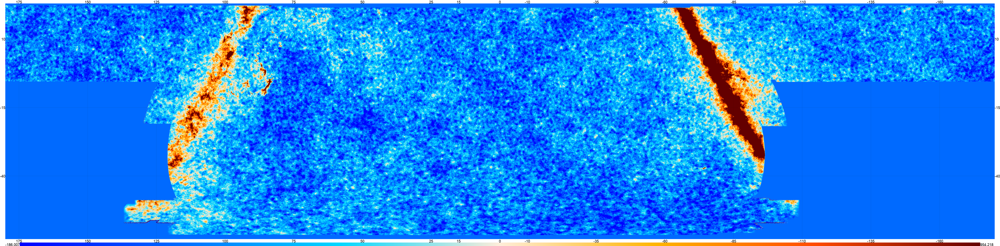

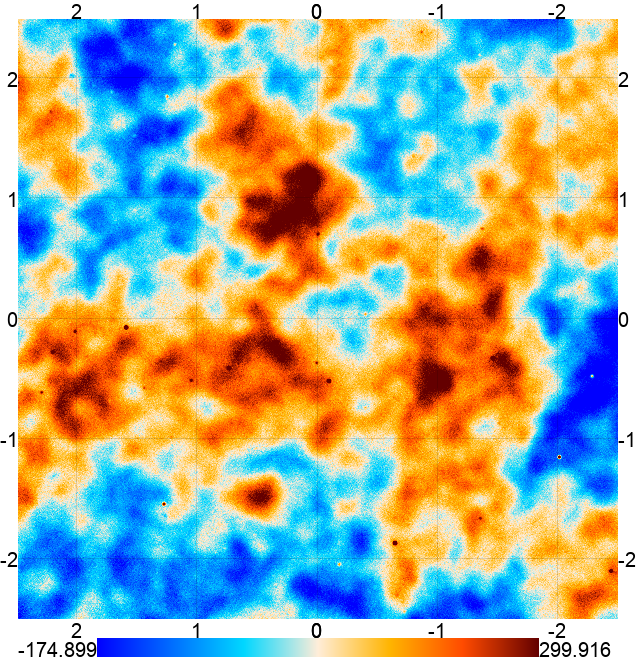

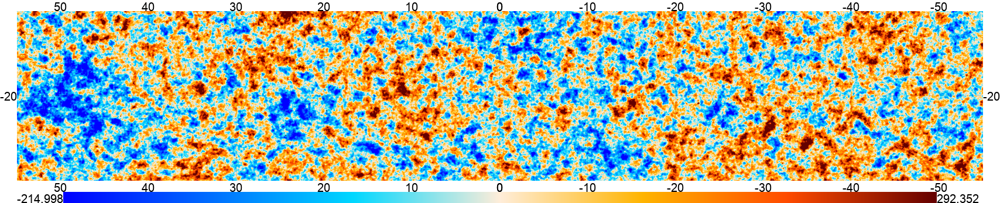

car:{cdelt:[-0.008333,0.008333],crval:[0,0],crpix:[2.16e+04,7561]}
car:{cdelt:[-0.008333,0.008333],crval:[0,0],crpix:[6601,3561]}


In [2]:
%run Section_2_coadded_maps.ipynb

## Begin Converting Between HEALPix and CAR


When reprojecting it's helpful to keep in mind that Pixell automatically rotates maps from Planck's Galactic projection to Equatorial, if you are projecting a different map other rotations may be needed. 

Note that projections work by finding the spherical harmonic transformation of the HEALPix map to alm's and then inversely transforms the alm's to the rectangular pixel map geometry.  

Finally for anyone in looking at small patches of the sky we encourage you to use the maps in CAR format with Pixell as it enables users to reference patches in a way that HEALPix can't do.

### Convert a planck HEALPix map to CAR

NSIDE = 2048
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


//anaconda3/lib/python3.7/site-packages/healpy/fitsfunc.py:372: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))


Ordering converted to RING
Preparing SHT
T -> alm
float64 complex128
Computing pixel positions
Computing rotated positions
Projecting


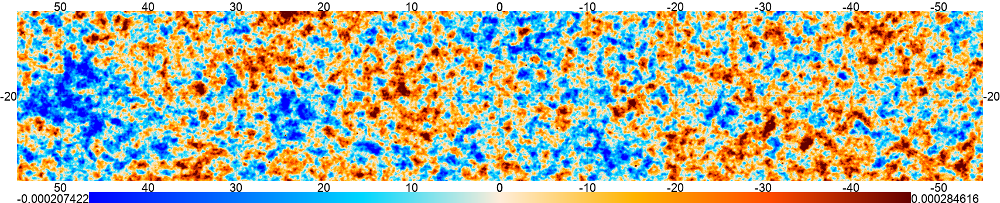

In [3]:
# Read in Planck Map
pmap_fname = path + "HFI_SkyMap_143_2048_R2.02_full.fits"

# Reproject the map to the same shape and wcs as our smap_2 from the previous notebook (linked in the table of contents as section 2)
planck_map = reproject.enmap_from_healpix(pmap_fname, smap_2.shape, smap_2.wcs, \
                                  ncomp=1, unit=1, lmax=6000,rot='gal,equ')

# Visualize using eshow
eshow(planck_map, **{"downgrade": 8, "colorbar":True, "ticks": 10, })

### Convert a CAR map to HEALPix 

We can also take our trimmed ACT map and project it to the HEALPix format using reproject as shown here.

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


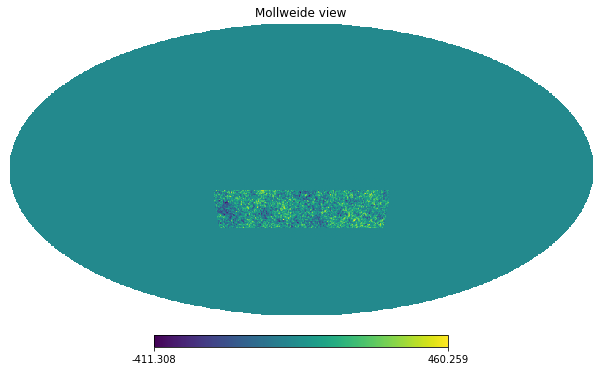

In [4]:
# Convert an ndmap map to HEALPix
smap_healpix = reproject.healpix_from_enmap(smap_2, lmax = 6000, nside = 512)

hp.mollview(smap_healpix)

### Continue to the next section

[Section 4](Section_4_visualize_objects.ipynb):  Guide to using Pixell to look at objects in the maps and stacking our maps on catalogue positions.